# Blazakis wind forecast - refit on best model  <a class="tocSkip">

/ HYSTORY / -----------------------------------------------------------------

2023/11/16: v0 /

2023/11/17: v0_1 /
    
- Updated: Edited following `wind_v3_1`

2023/12/13: v1 /
    
- Updated: Edited following `wind_v4`
- Updated: Added SHAP values

/ TODO / --------------------------------------------------------------------
    
/ NOTES / -------------------------------------------------------------------


In [1]:
%load_ext autoreload
%autoreload 2
from pathlib import Path
import ipynbname
import os

# Script name and folder -----------------------------------------------------
script_path = str(Path().absolute())
print('Current path:', script_path)

#script_vers = script_name.split("_v")[-1].strip(".py")
#script_name = ipynbname.name()
#print('Script version: %s' % script_vers)
#-----------------------------------------------------------------------------

# Results folder -------------------------------------------------------------
path_results_main = script_path + "/results"
# folder where the current run's results shall be nested in

if not os.path.exists(path_results_main):
    os.makedirs(path_results_main)
    print('Folder "%s" created.' % os.path.basename(path_results_main))
#-----------------------------------------------------------------------------

import warnings
warnings.filterwarnings('ignore')
# keep it quiet, jeez!

Current path: /data/users/pbonfini/blazakis/wind


In [191]:
path_data = script_path + "/../data"

# Tunable variables ----------------------------------------------------------
debug = False

# Data:
path_to_data = path_data+'/wind_speed_database.csv'

columns_predictors = ['Vwind']
column_of_interest = 'Vwind'
#-----------------------------------------------------------------------------

In [192]:
import os
#os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.ticker as ticker

# Loading data

In [193]:
%matplotlib inline

# Loading:
df = pd.read_csv(path_to_data, compression=None,  \
                 header=0, index_col=False, sep=',', quotechar='"')
display(df.head(5))

if debug:
    df = df.iloc[:4000]

print('Original data points number:', len(df))

,day,time (HHMM),Tair,Vwind,GHI,DHI
0,1.0,35.83,6.62,2.41,0.0,0.0
1,1.0,135.83,5.28,2.43,0.0,0.0
2,1.0,235.83,4.74,2.76,0.0,0.0
3,1.0,335.83,4.68,3.38,0.0,0.0
4,1.0,435.83,4.54,3.15,0.0,0.0


Original data points number: 8760


## Converting time to seconds

In [194]:
def hhmm_to_seconds(decimal_time):
    try:
        hours = int(decimal_time // 100)
        minutes = int(decimal_time % 100)
        seconds_decimal = (decimal_time - int(decimal_time)) * 60
        
        if 0 <= hours < 24 and 0 <= minutes < 60 and 0 <= seconds_decimal < 60:
            total_seconds = hours * 3600 + minutes * 60 + seconds_decimal
            return total_seconds
        else:
            raise ValueError("Invalid HHMM time format")
    except (ValueError, IndexError):
        raise ValueError("Invalid HHMM time format")

# Filling missing HHMMs ------------------------------------------------------
# No missing entries
#-----------------------------------------------------------------------------
        
# Converting -----------------------------------------------------------------
df['time_s'] = df['time (HHMM)'].apply(hhmm_to_seconds) + df['day']*86400
# 1 day = 60*60*24 = 86400 sec

# Setting origin to 0:
df['time_s'] = df['time_s'] - np.min(df['time_s'])
#-----------------------------------------------------------------------------

# Cast datatype to save RAM --------------------------------------------------
for col in df.select_dtypes(include='float64').columns:
    df[col] = df[col].astype('float32')
#-----------------------------------------------------------------------------

# Sanity check ---------------------------------------------------------------
# Calculate the differences between consecutive time values:
df_delta = df['time_s'].diff().round(4)
# NOTE: `round` is used to avoid precision issues

# Check where differences are not equal to the first difference:
not_equal_to_first = df_delta.loc[1:] != df_delta.iloc[1]
# NOTE: Comparing against the second entry (indexed by '1') because the first
#       is NaN by construction (no previous times to compare to)

# Get the indices where differences are not equal to the first difference
idxs_not_equal = not_equal_to_first.index[not_equal_to_first]

if idxs_not_equal.empty:
    print("Check:: all timesteps equally spaced.")
else:
    print("Check:: timesteps not equal to the first, at indices:", list(idxs_not_equal))
    print("'--> Expected difference (1st timestep):", df_delta.iloc[1])
    print("'--> Actual differences:")
    display(df_delta.iloc[idxs_not_equal])
#-----------------------------------------------------------------------------

# Selecting columns for analysis ---------------------------------------------
if columns_predictors[0] == column_of_interest: 
    df_ = pd.DataFrame(df[column_of_interest])
else:
    df_ = pd.DataFrame(df[columns_predictors + [column_of_interest]])
#-----------------------------------------------------------------------------

display(df)

Check:: all timesteps equally spaced.


,day,time (HHMM),Tair,Vwind,GHI,DHI,time_s
0,1.0,35.830002,6.62,2.41,0.0,0.0,0.0
1,1.0,135.830002,5.28,2.43,0.0,0.0,3600.0
2,1.0,235.830002,4.74,2.76,0.0,0.0,7200.0
3,1.0,335.829987,4.68,3.38,0.0,0.0,10800.0
4,1.0,435.829987,4.54,3.15,0.0,0.0,14400.0
...,...,...,...,...,...,...,...
8755,365.0,1935.829956,10.61,1.64,0.0,0.0,31518000.0
8756,365.0,2035.829956,10.19,2.34,0.0,0.0,31521600.0
8757,365.0,2135.830078,9.65,4.55,0.0,0.0,31525200.0
8758,365.0,2235.830078,10.00,5.34,0.0,0.0,31528800.0


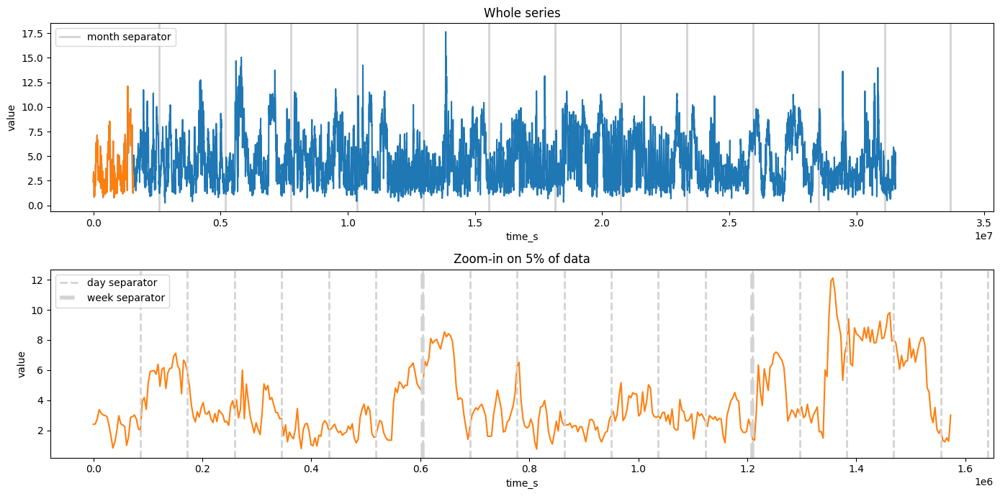

In [195]:
idx_MAX_ = int(0.05*len(df))

fig, axes = plt.subplots(figsize=(14, 7), nrows=2, ncols=1)

# Separators:
current_time_s = 0
while current_time_s < np.max(df['time_s'].values):
    current_time_s += 86400*30 # 1 month in seconds
    axes[0].axvline(x=current_time_s, ls='-', lw=2, c='lightgrey', label='month separator')

axes[0].set_title('Whole series')
axes[0].set_xlabel('time_s')
axes[0].set_ylabel('value')
axes[0].plot(df['time_s'], df[column_of_interest].values, c='C0')
axes[0].plot(df['time_s'].iloc[:idx_MAX_], df[column_of_interest].iloc[:idx_MAX_].values, c='C1')

axes[1].set_title('Zoom-in on 5% of data')
axes[1].set_xlabel('time_s')
axes[1].set_ylabel('value')
axes[1].plot(df['time_s'].iloc[:idx_MAX_], df[column_of_interest].iloc[:idx_MAX_].values, c='C1')

# Separators:
current_time_s = 0
while current_time_s < df['time_s'].values[idx_MAX_]:
    current_time_s += 86400 # 1 day in seconds
    axes[1].axvline(x=current_time_s, ls='--', lw=2, c='lightgrey', label='day separator')
    if current_time_s % int(86400*7) == 0: # 1 week in seconds
        axes[1].axvline(x=current_time_s, ls='--', lw=4, c='lightgrey', label='week separator')

# Removing redundant legend labels and plotting legend:
for ax in axes:
    ax.legend()
    handles, labels = ax.get_legend_handles_labels()
    unique_legend = {}
    for h, l in zip(handles, labels):
        if l not in unique_legend:
            unique_legend[l] = h
    ax.legend_.remove()
    ax.legend(unique_legend.values(), unique_legend.keys())
    
plt.tight_layout()
plt.show()

# Loading CV results

In [196]:
path_to_cv = '/data/users/pbonfini/blazakis/wind/results/run_50/scores.csv'

df_scores = pd.read_csv(path_to_cv, index_col=0)
display(df_scores)

,model,DLSTM__batch_size,DLSTM__lr,LGB__boosting_type,LGB__colsample_bytree,LGB__learning_rate,LGB__max_depth,LGB__n_estimators,LGB__num_leaves,LGB__reg_alpha,...,regr,stride,win_size,win_smooth,MAE_train,MAE_valid,MAE_test,RMSE_train,RMSE_valid,RMSE_test
0,config_0,32.0,0.005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DLSTM,1,24,8,1.910511,1.813803,2.217143,2.454067,2.215239,2.649356
1,config_0,32.0,0.005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DLSTM,1,24,8,2.026065,1.707180,1.681190,2.699926,2.251994,2.146656
2,config_0,32.0,0.005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DLSTM,1,24,8,1.912956,1.937713,1.589378,2.359466,2.281812,1.941938
3,config_0,32.0,0.005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DLSTM,1,24,8,1.720012,1.407828,1.493013,2.321473,1.841751,1.906219
4,config_0,32.0,0.005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DLSTM,1,24,8,1.681115,1.433416,1.871835,2.131747,1.825947,2.196018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,config_49,32.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DLSTM,1,24,2,1.879687,1.776205,2.030816,2.373886,2.172871,2.446206
246,config_49,32.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DLSTM,1,24,2,1.873394,1.710936,1.681607,2.359103,2.114631,2.052238
247,config_49,32.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DLSTM,1,24,2,1.774410,1.777910,1.399645,2.378089,2.240632,1.864949
248,config_49,32.0,0.001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DLSTM,1,24,2,1.842521,1.542763,1.603881,2.342764,1.917358,1.970015


## Looking for best model

In [197]:
# > Selecting by mean score

grouped = df_scores.groupby('model')['RMSE_test'].mean()

# Find the category with the best (highest) mean:
best_model = grouped.idxmin()
best_RMSE_test_mu = grouped.min()

print("Best model: %s | <RMSE_test>: %.3f" % (best_model, best_RMSE_test_mu))

df_best_score = df_scores[df_scores['model'] == best_model]
# dataframe of CV scores for the best model only
display(df_best_score)

Best model: config_2 | <RMSE_test>: 1.838


,model,DLSTM__batch_size,DLSTM__lr,LGB__boosting_type,LGB__colsample_bytree,LGB__learning_rate,LGB__max_depth,LGB__n_estimators,LGB__num_leaves,LGB__reg_alpha,...,regr,stride,win_size,win_smooth,MAE_train,MAE_valid,MAE_test,RMSE_train,RMSE_valid,RMSE_test
10,config_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,LR,1,24,1,1.677588,1.569333,1.794387,2.177368,1.955332,2.167300
11,config_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,LR,1,24,1,1.672813,1.576677,1.534551,2.173237,1.974442,1.901724
12,config_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,LR,1,24,1,1.607092,1.600401,1.299065,2.122266,1.974853,1.687535
13,config_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,LR,1,24,1,1.594729,1.370996,1.323625,2.103430,1.745241,1.653221
14,config_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,LR,1,24,1,1.514685,1.273055,1.485846,1.977857,1.662680,1.779793


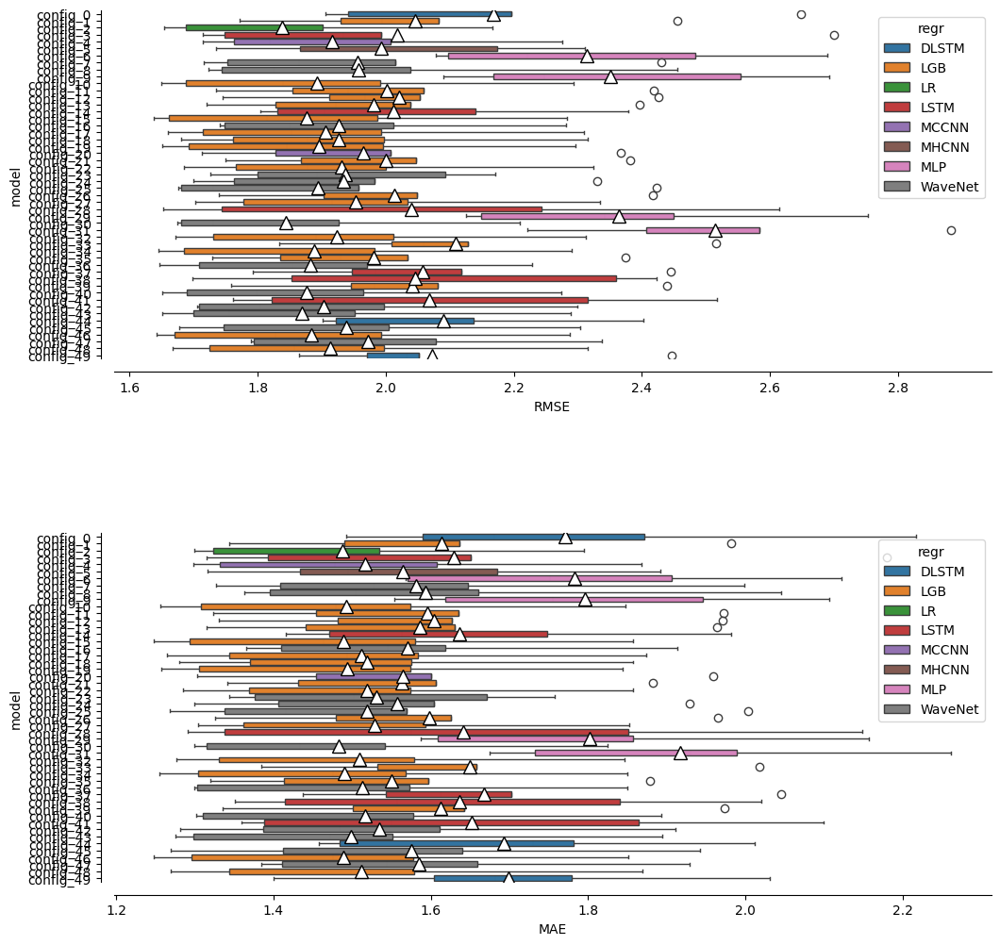

In [198]:
import seaborn as sns

fig, axes = plt.subplots(2, 1, figsize=(12, 12), gridspec_kw={'hspace': 0.5})

medianprops = {'linestyle': '-.',
               'linewidth': 0.01, 'color': 'black'} 
# NOTE: Setting minimal linewidth will hide the median
meanprops={"markeredgecolor": "black", "markerfacecolor": "white", "markersize": "10"}

sns.boxplot(ax=axes[0], data=df_scores, x="RMSE_test", y="model", hue="regr",
            medianprops=medianprops, showmeans=True, meanprops=meanprops)
axes[0].set_xlabel('RMSE')

sns.boxplot(ax=axes[1], data=df_scores, x="MAE_test", y="model", hue="regr",
            medianprops=medianprops, showmeans=True, meanprops=meanprops)
axes[1].set_xlabel('MAE')

for ax in axes:
    sns.despine(ax=ax, offset=10)

In [199]:
# > Isolating best config

df_best_config = df_best_score.copy(deep=True)
# dataframe of the best config hyperparameters only

# Drop score columns:
columns_to_drop = [col for col in df_best_config.columns if\
                   col.startswith('RMSE') or col.startswith('MAE')]
df_best_config.drop(columns=columns_to_drop, inplace=True)

# Drop duplicates, since at this point all rows are identical:
df_best_config.drop_duplicates(inplace=True)

display(df_best_config)

# Convert to dictionary:
best_config = df_best_config.to_dict(orient='records')

,model,DLSTM__batch_size,DLSTM__lr,LGB__boosting_type,LGB__colsample_bytree,LGB__learning_rate,LGB__max_depth,LGB__n_estimators,LGB__num_leaves,LGB__reg_alpha,...,WaveNet__batch_size,WaveNet__lr,WaveNet__n_filters,WaveNet__n_residual_blocks,n_targets,nterms,regr,stride,win_size,win_smooth
10,config_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,24,10,LR,1,24,1


In [200]:
configs = best_config
# setting this for maximal compatibility with the CV script

# Setting up

## Constructors

In [201]:
from tensorflow import keras
import tensorflow as tf
from keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
#
from keras.models import Model
from keras.layers import Input, LSTM, Dense, Conv1D, MaxPooling1D, Flatten,\
                         BatchNormalization, Activation, Dropout, Input,\
                         RepeatVector, Add, Multiply, concatenate, Layer
#
from tensorflow.keras import regularizers
#
import time

def root_mean_squared_error(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

class TimeHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)
        
time_callback = TimeHistory()

### Multi-Channel CNN constructor

In [202]:
def build_MCCNN_model(win_size=24, n_targets=24, n_features=3, batch_size=32,
                    lr=1e-3):
    '''NOTE: Not all input parameters are used in the constructor, but appear
    in the function definition so that the whole config dictionary can be
    passed to it.'''
    
    keras.backend.clear_session()
    
    model = keras.Sequential()
    model.add(Input(shape=(win_size, n_features)))
    model.add(Conv1D(filters=32, kernel_size=3, activation='relu'))
    model.add(Conv1D(filters=32, kernel_size=3, activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Conv1D(filters=16, kernel_size=3, activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(n_targets, activation='relu'))
    model.add(Dense(n_targets, activation='linear'))

    opt = Adam(learning_rate=lr) 

    model.compile(loss=root_mean_squared_error, optimizer=opt, 
                  metrics=['MAE', root_mean_squared_error])

    return model

model = build_MCCNN_model()

print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 22, 32)            320       
                                                                 
 conv1d_1 (Conv1D)           (None, 20, 32)            3104      
                                                                 
 max_pooling1d (MaxPooling1  (None, 10, 32)            0         
 D)                                                              
                                                                 
 conv1d_2 (Conv1D)           (None, 8, 16)             1552      
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 4, 16)             0         
 g1D)                                                            
                                                                 
 flatten (Flatten)           (None, 64)                0

### Distributed LSTM constructor
(Blazakis' WS-Encoder-Decoder LSTM)

In [203]:
def build_DLSTM_model(win_size=24, n_targets=24, n_features=3, batch_size=32,
                     lr=1e-3):
    '''NOTE: Not all input parameters are used in the constructor, but appear
    in the function definition so that the whole config dictionary can be
    passed to it.'''
    
    keras.backend.clear_session()

    reg = regularizers.l2(5e-3)

    model = keras.Sequential()
    model.add(keras.layers.Input(shape=( win_size, n_features)))
    model.add(keras.layers.LSTM(32, activation='tanh', return_sequences=True,
                            kernel_regularizer=reg,
                            recurrent_regularizer=reg))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LSTM(32, activation='tanh', return_sequences=True,
                            kernel_regularizer=reg,
                            recurrent_regularizer=reg))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.TimeDistributed(keras.layers.Dense(32, activation='relu', kernel_regularizer=reg)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.TimeDistributed(keras.layers.Dense(1, activation='linear')))

    opt = keras.optimizers.Adam(learning_rate=lr) 

    model.compile(loss=root_mean_squared_error, optimizer=opt, 
                  metrics=['MAE', root_mean_squared_error])

    return model

model = build_DLSTM_model()

print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 24, 32)            4608      
                                                                 
 batch_normalization (Batch  (None, 24, 32)            128       
 Normalization)                                                  
                                                                 
 lstm_1 (LSTM)               (None, 24, 32)            8320      
                                                                 
 batch_normalization_1 (Bat  (None, 24, 32)            128       
 chNormalization)                                                
                                                                 
 time_distributed (TimeDist  (None, 24, 32)            1056      
 ributed)                                                        
                                                        

### Multi-Head CNN

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 24, 3)]              0         []                            
                                                                                                  
 feature_split_layer (Featu  [(None, 24, 1),              0         ['input_1[0][0]']             
 reSplitLayer)                (None, 24, 1),                                                      
                              (None, 24, 1)]                                                      
                                                                                                  
 conv1d (Conv1D)             (None, 22, 32)               128       ['feature_split_layer[0][0]'] 
                                                                                              

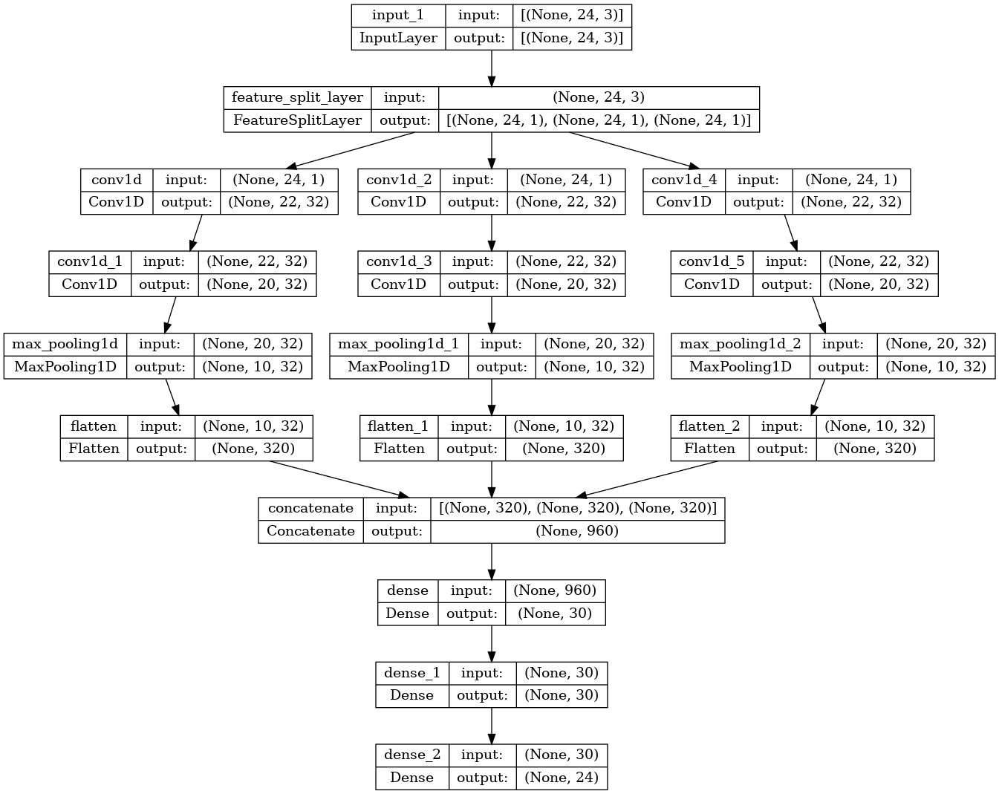

In [204]:
class FeatureSplitLayer(Layer):
    def __init__(self, n_features, **kwargs):
        super().__init__(**kwargs)
        self.n_features = n_features

    def call(self, inputs):
        return [tf.reshape(inputs[:, :, i], (-1, tf.shape(inputs)[1], 1)) for i in range(self.n_features)]


def build_MHCNN_model(win_size=24, n_targets=24, n_features=3, batch_size=32,
                     lr=1e-3):
    '''NOTE: Not all input parameters are used in the constructor, but appear
    in the function definition so that the whole config dictionary can be
    passed to it.'''
    
    keras.backend.clear_session()

    in_layer = Input(shape=(win_size, n_features))
   
    # Split the input into n_features parts
    split_layers = FeatureSplitLayer(n_features)(in_layer)

    out_layers = []
    for split_input in split_layers:
        conv1 = Conv1D(32, 3, activation='relu')(split_input)
        conv2 = Conv1D(32, 3, activation='relu')(conv1)
        pool1 = MaxPooling1D()(conv2)
        flat = Flatten()(pool1)
        out_layers.append(flat)
    
    merged = concatenate(out_layers)

    dense1 = Dense(30, activation='relu')(merged)
    dense2 = Dense(30, activation='tanh')(dense1)
    outputs = Dense(n_targets)(dense2)

    model = Model(inputs=in_layer, outputs=outputs)    

    opt = keras.optimizers.Adam(learning_rate=lr) 

    model.compile(loss=root_mean_squared_error, optimizer=opt, 
                  metrics=['MAE', root_mean_squared_error])

    return model

model = build_MHCNN_model()
print(model.summary())

from keras.utils import plot_model
plot_model(model, show_shapes=True) #, to_file='model.png'

### LSTM constructor

In [205]:
def build_LSTM_model(win_size=24, n_targets=24, n_features=3, batch_size=32,
                     lr=1e-3):
    '''NOTE: Not all input parameters are used in the constructor, but appear
    in the function definition so that the whole config dictionary can be
    passed to it.'''
    
    keras.backend.clear_session()

    reg = regularizers.l2(5e-3)

    model = keras.Sequential()
    model.add(keras.layers.Input(shape=( win_size, n_features)))
    model.add(keras.layers.LSTM(16,  activation='tanh', return_sequences=True,
                            kernel_regularizer=reg,
                            recurrent_regularizer=reg))
    model.add(keras.layers.LSTM(16,  activation='tanh',
                            kernel_regularizer=reg,
                            recurrent_regularizer=reg))
    model.add(keras.layers.Dense(24, activation='relu'))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Dense(12, activation='relu'))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Dense(n_targets, activation='linear'))

    opt = keras.optimizers.Adam(learning_rate=lr) 

    model.compile(loss=root_mean_squared_error, optimizer=opt, 
                  metrics=['MAE', root_mean_squared_error])

    return model

model = build_LSTM_model()

print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 24, 16)            1280      
                                                                 
 lstm_1 (LSTM)               (None, 16)                2112      
                                                                 
 dense (Dense)               (None, 24)                408       
                                                                 
 batch_normalization (Batch  (None, 24)                96        
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 12)                300       
                                                                 
 batch_normalization_1 (Bat  (None, 12)                48        
 chNormalization)                                       

### WaveNet constructor

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 24, 3)]              0         []                            
                                                                                                  
 conv1d (Conv1D)             (None, 24, 32)               224       ['input_2[0][0]']             
                                                                                                  
 conv1d_1 (Conv1D)           (None, 24, 32)               224       ['input_2[0][0]']             
                                                                                                  
 multiply (Multiply)         (None, 24, 32)               0         ['conv1d[0][0]',              
                                                                     'conv1d_1[0][0]']        

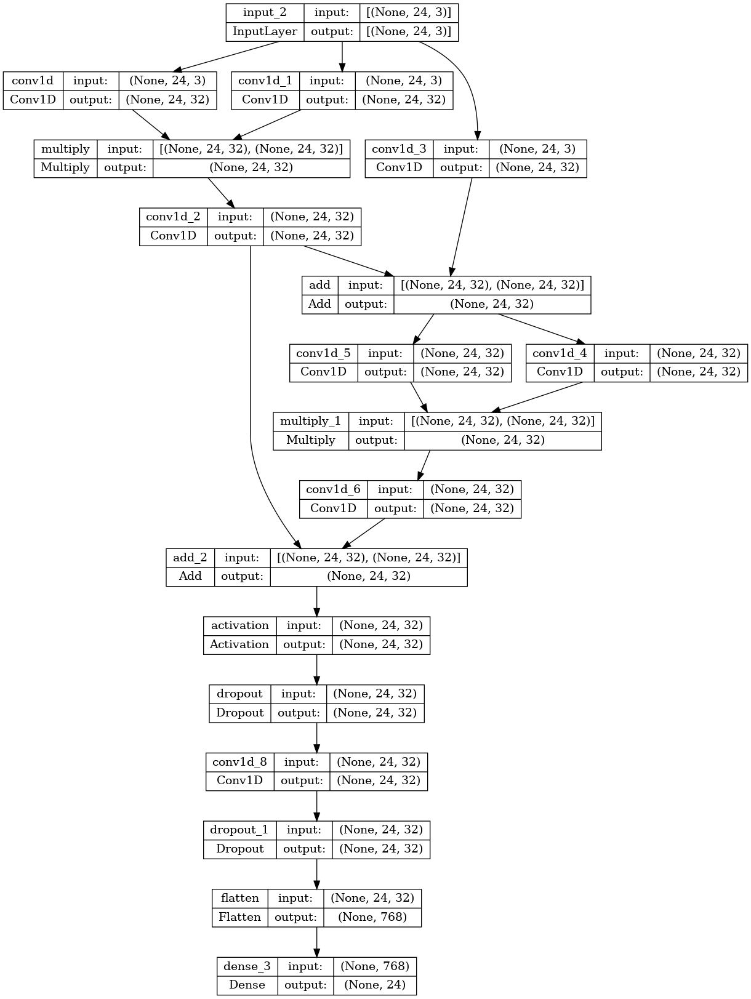

In [206]:
def WaveNetResidualConv1D(n_filters, kernel_size, dilation_rate, input_n_filters):
    '''Function for creating a residual block in the WaveNet structure.'''
    
    def build_residual_block(l_input):
        # Gated activation
        l_sigmoid_conv1d = Conv1D(n_filters, kernel_size, dilation_rate=dilation_rate, 
                                  padding='same', activation='sigmoid')(l_input)
        l_tanh_conv1d = Conv1D(n_filters, kernel_size, dilation_rate=dilation_rate, 
                               padding='same', activation='tanh')(l_input)
        l_mul = Multiply()([l_sigmoid_conv1d, l_tanh_conv1d])

        # Skip connection:
        l_skip_connection = Conv1D(n_filters, 1)(l_mul)

        # Transforming input to have the same number of filters before adding:
        if n_filters != input_n_filters:
            l_input_transformed = Conv1D(n_filters, 1)(l_input)
        else:
            l_input_transformed = l_input

        l_residual = Add()([l_input_transformed, l_skip_connection])

        return l_residual, l_skip_connection

    return build_residual_block

def build_WaveNet_model(win_size=24, n_targets=24, n_features=3, n_filters=32,
                        kernel_size=2, n_residual_blocks=2,
                        batch_size=32, lr=1e-3):
    
    # Converting any float to int, in case the parameter is passed as float:
    n_residual_blocks = int(n_residual_blocks)
    n_filters         = int(n_filters)
    kernel_size       = int(kernel_size)
    
    inputs = Input(shape=(win_size, n_features))
    x = inputs

    skip_connections = []

    # Stacked residual blocks:
    for i in range(n_residual_blocks):
        x, skip = WaveNetResidualConv1D(n_filters, kernel_size, 2**i, n_features)(x)
        skip_connections.append(skip)

    # Add all skip connections:
    net = Add()(skip_connections)
    net = Activation('relu')(net)
    net = Dropout(0.2)(net)
    net = Conv1D(n_filters, kernel_size=1, activation='relu')(net)
    net = Dropout(0.2)(net)
    net = Flatten()(net)
    net = Dense(n_targets)(net)

    model = Model(inputs=inputs, outputs=net)

    opt = Adam(learning_rate=lr) 
    
    model.compile(loss=root_mean_squared_error, optimizer=opt, 
                  metrics=['MAE', root_mean_squared_error])

    return model

model = build_WaveNet_model()
model.summary()

from keras.utils import plot_model
plot_model(model, show_shapes=True) #, to_file='model.png'

# Refitting

In [207]:
def plot_a_few_windows(X_idxs, X, y_idxs, y, df_, title='Windowed data'):
    '''Plots a few windows of a windowed dataset.'''
    
    n_features = X.shape[-1]
    fig, axes = plt.subplots(figsize=(14, 5*n_features), nrows=2*n_features,
                             ncols=2, constrained_layout=True)

    plt.suptitle(title, fontsize=14)

    axes[0, 0].set_title('A few predicting windows')
    axes[0, 1].set_title('Corresponding target windows [repeated]')
    axes[n_features, 0].set_title('Zoom-in on one window/target')

    # Iterating over features:
    for j in range(n_features):

        # Top panels:
        for m in range(5):
            axes[j, 0].plot(X_idxs[m, :], X[m, :, j] - m/10,
                            c='C0', alpha=(1-1/5*m))
            axes[j, 1].scatter(y_idxs[m], y[m] - m/10, s=5,
                            c='purple', alpha=(1-1/5*m))
            axes[j, 1].plot(y_idxs[m], y[m] - m/10,
                            c='purple', alpha=(1-1/5*m))

        # Bottom panels:
        axes[j+n_features, 0].plot(X_idxs[0, :], X[0, :, j], c='C0')
        axes[j+n_features, 1].scatter(y_idxs[0], y[0], s=5, c='purple')
        axes[j+n_features, 1].plot(y_idxs[0], y[0], c='purple')

        axes[j, 0].set_ylabel(df_.columns[j])
        axes[j+n_features, 0].set_ylabel(df_.columns[j])

    for ax in axes[:, 0]: ax.sharex(axes[0, 0])
    for ax in axes[:, 1]: ax.sharex(axes[0, 1])

    for m in [0, 1]:
        axes[m*n_features, 0].set_xlabel('index')
        axes[m*n_features, 1].set_xlabel('index')

    plt.tight_layout()
    fig.subplots_adjust(hspace=0.4)
    plt.show()

+--------------+
|  Data split  |
+-------+------+
|  set  | size |
+-------+------+
| Train | 7884 |
| Valid | 175  |
|  Test | 701  |
+-------+------+
|================================= CONFIGURATION ID: config_0  [ 1/ 1] =================================|


,model,DLSTM__batch_size,DLSTM__lr,LGB__boosting_type,LGB__colsample_bytree,LGB__learning_rate,LGB__max_depth,LGB__n_estimators,LGB__num_leaves,LGB__reg_alpha,...,WaveNet__batch_size,WaveNet__lr,WaveNet__n_filters,WaveNet__n_residual_blocks,n_targets,nterms,regr,stride,win_size,win_smooth
0,config_2,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,24,10,LR,1,24,1



|--------------------------------- config_0  |---------------------------------|


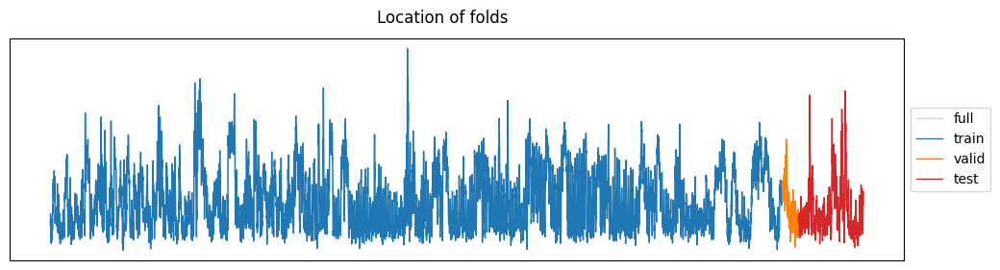

+-----------------------+
| Fold's dataset shapes |
+--------+--------------+
|  set   |    shape     |
+--------+--------------+
| Train  |  (7884, 1)   |
| Valid  |   (175, 1)   |
|  Test  |   (701, 1)   |
+--------+--------------+
Windowing train set


 99%|████████████████████████████████████▊| 7837/7884 [00:01<00:00, 4189.87it/s]


Windowing validation set


 73%|████████████████████████████▌          | 128/175 [00:00<00:00, 4389.43it/s]


Windowing test set


 93%|████████████████████████████████████▍  | 654/701 [00:00<00:00, 4359.85it/s]


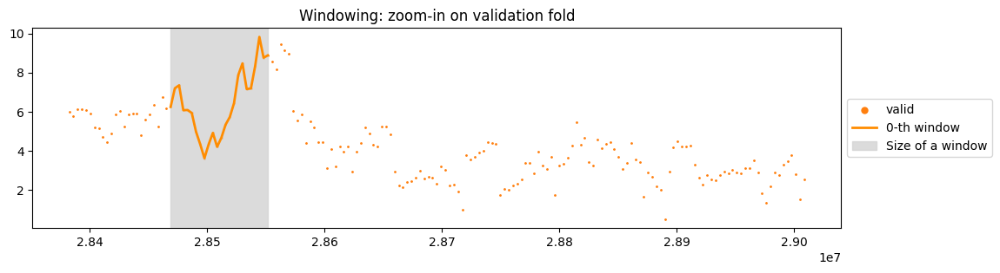

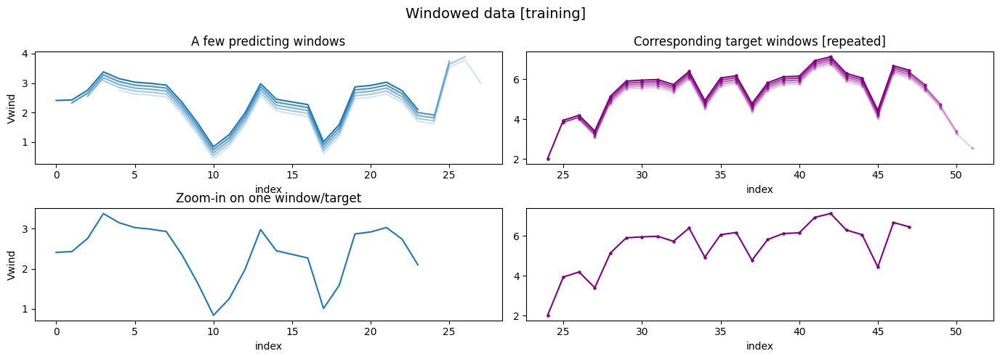

+------------------------------------+
|      Windowed dataset shapes       |
+-------+---------------+------------+
|  set  |    X shape    |  y shape   |
+-------+---------------+------------+
| Train | (7837, 24, 1) | (7837, 24) |
| Valid |  (128, 24, 1) | (128, 24)  |
|  Test |  (654, 24, 1) | (654, 24)  |
+-------+---------------+------------+


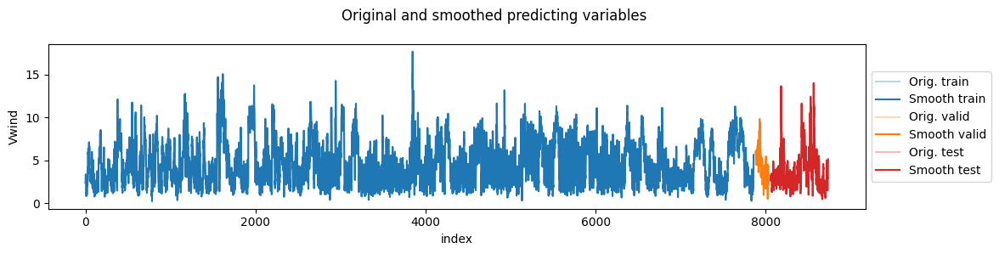

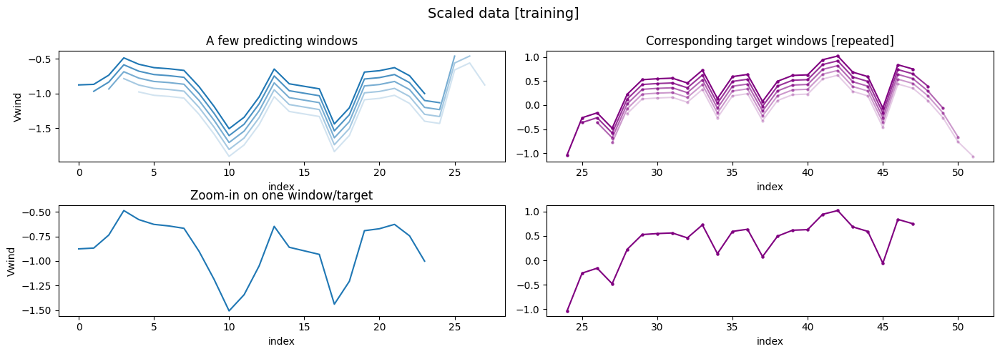

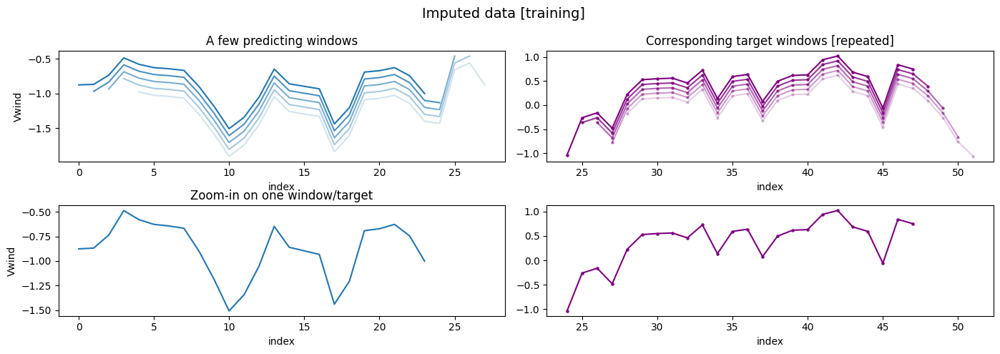

CustomEstimator(subestimator=LinearRegression())

Train scores --- MAE: 1.55 | RMSE: 2.01
Valid scores --- MAE: 1.20 | RMSE: 1.54
Test  scores --- MAE: 1.58 | RMSE: 2.18


,model,DLSTM__batch_size,DLSTM__lr,LGB__boosting_type,LGB__colsample_bytree,LGB__learning_rate,LGB__max_depth,LGB__n_estimators,LGB__num_leaves,LGB__reg_alpha,...,regr,stride,win_size,win_smooth,MAE_train,MAE_valid,MAE_test,RMSE_train,RMSE_valid,RMSE_test
0,config_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,LR,1,24,1,1.55044,1.203189,1.578009,2.014418,1.535777,2.178969


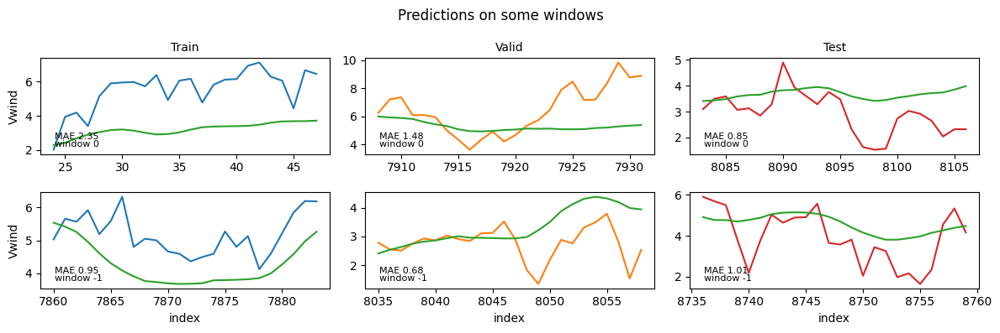

,0,1,2,3,4,5,6,7,8,9,...,141,142,143,144,145,146,147,148,149,150
0,5.989203,5.922412,5.881473,5.812621,5.598089,5.432199,5.307092,5.078100,4.947354,4.926296,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,6.179670,6.131874,6.054127,5.828216,5.651005,5.500641,5.255701,5.112591,5.070773,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.337135,3.603168,3.960878,4.184959,4.355990,4.413540,4.369472,4.270482,4.116220,NaN
127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.212680,3.498590,3.877237,4.118002,4.308593,4.376812,4.320515,4.193770,3.986702,3.939439


,0,1,2,3,4,5,6,7,8,9,...,667,668,669,670,671,672,673,674,675,676
0,3.412976,3.435916,3.487497,3.588562,3.643294,3.654626,3.771382,3.829144,3.843188,3.912416,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,3.171884,3.276906,3.409533,3.491917,3.523212,3.664845,3.732644,3.750685,3.839396,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.008364,3.814106,3.658083,3.651643,3.712574,3.80527,3.950815,4.042773,4.104600,NaN
653,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.156886,3.963689,3.807808,3.810622,3.879399,3.96941,4.144480,4.263425,4.389256,4.480852


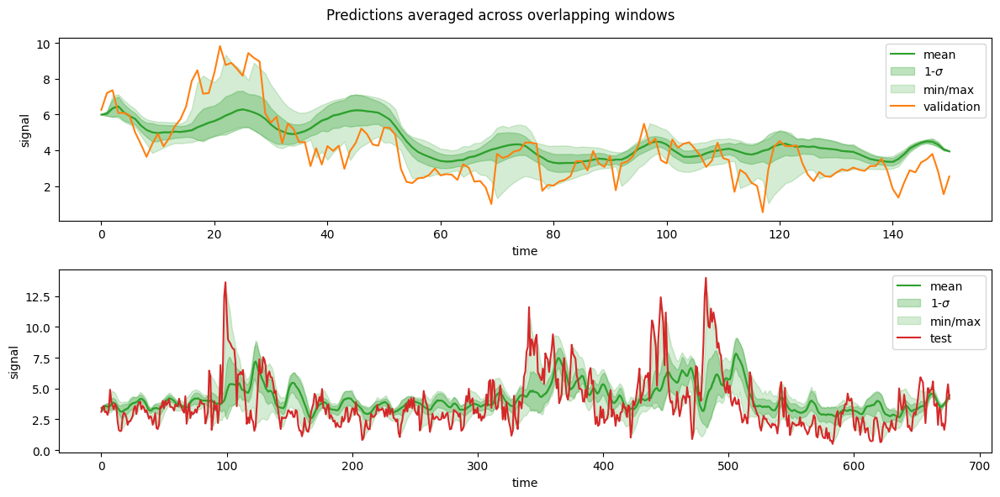




config_0 time: 3.53 sec


,model,DLSTM__batch_size,DLSTM__lr,LGB__boosting_type,LGB__colsample_bytree,LGB__learning_rate,LGB__max_depth,LGB__n_estimators,LGB__num_leaves,LGB__reg_alpha,...,regr,stride,win_size,win_smooth,MAE_train,MAE_valid,MAE_test,RMSE_train,RMSE_valid,RMSE_test
0,config_2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,LR,1,24,1,1.55044,1.203189,1.578009,2.014418,1.535777,2.178969


CPU times: user 6.21 s, sys: 8.41 s, total: 14.6 s
Wall time: 3.53 s


In [208]:
%%time

# Train/Test splitting:
from prettytable import PrettyTable
# Stationary:
from src.lomb_scargle_v0 import LS
# Windowing:
from src.windowing_multi_v0_1 import windowing_multi, invert_windowing
# Cross-validating:
from sklearn.model_selection import GridSearchCV, KFold
import time
# Imputing:
from sklearn.impute import SimpleImputer
# Defining model:
from src.CustomEstimator_v0_1_solar import CustomEstimator
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
# Scaling:
from sklearn.preprocessing import StandardScaler, QuantileTransformer
# Performance:
from sklearn.metrics import mean_absolute_error, mean_squared_error
#from sklearn.metrics import mean_absolute_percentage_error   

# Train/Test splitting -------------------------------------------------------
# Hard split of the data

train_ratio = 0.9
# fraction of data to be used for refitting
'''This is copy-pasted from the CV script, in order to ensure that the
hold-out test data have never been used for training.'''

idxs_train = np.arange(int(train_ratio*len(df_)))
# refit data
idxs_validhtest = np.arange(int(train_ratio*len(df_)), len(df_))
# validation and hold-out test set
'''
Differently from the CV Script, now the validation set is carved out of the
hold-out test set, since it is also supposed to not ever been seen.

NOTE: The validation is only used by the NNs, but it is nevertheless
         created adn ignored even when running the other algorithms,
         in order to guarantee a fair assessment comparison.
'''
n_valid = int(len(idxs_validhtest)*0.2)

idxs_valid = idxs_validhtest[:n_valid]
idxs_test  = idxs_validhtest[n_valid:]

df_train = df_.iloc[idxs_train]
df_valid = df_.iloc[idxs_valid]
df_test  = df_.iloc[idxs_test]

df_train_full = df.iloc[idxs_train]
df_valid_full = df.iloc[idxs_valid]
df_test_full  = df.iloc[idxs_test]

table = PrettyTable()
table.title = str('Data split')
table.field_names = ['set', 'size']
table.add_row(['Train', len(df_train)])
table.add_row(['Valid', len(df_valid)])
table.add_row(['Test',  len(df_test)])
print(table)
#-----------------------------------------------------------------------------

df_scores = pd.DataFrame()
# dataframe or results indexed by config `label`

for c, config in enumerate(configs):
    start_time = time.time()

    ##### SETTING CONFIGURATION ##############################################

    # Extracting configuration variables for easier readability:
    N_freqs    = config['N_freqs']
    nterms     = config['nterms']
    win_size   = config['win_size']
    n_targets  = config['n_targets']
    stride     = config['stride']
    win_smooth = config['win_smooth']
    #
    regr      = config['regr']
    #
    label = "config_"+str(c)
    #
    regr_params = {key.replace(regr+'__', ''): value for key, value\
                   in config.items() if key.startswith(regr+'__')}    
    # dictionary of parameters for the regressor in this `config
    # (the rest of parameters, i.e. for other regressor types, will be ignored)`

    print(' %s ' % ('='*103))
    print('|%s CONFIGURATION ID: %-9s [%2s/%2s] %s|' %\
          ('='*33, label, c+1, len(configs), '='*33))
    print(' %s ' % ('='*103))
    display(pd.DataFrame.from_dict(\
        {key: str(value) for key, value in config.items()}, orient='index').T)
    ##########################################################################
   
    print('\n|%s %-9s |%s|' % ('-'*33, label, '-'*33))

    # Displaying fold size -----------------------------------------------
    fig, ax = plt.subplots(figsize=(12, 3), nrows=1, ncols=1,
                             gridspec_kw={'hspace': 0.5})

    fig.suptitle(str('Location of folds'), fontsize=12)
    ax.plot(df['time_s'], df[column_of_interest].values,\
               lw=1, c='lightgrey', label='full')
    ax.plot(df_train_full['time_s'], df_train[column_of_interest].values,\
               lw=1, c='C0', label='train')
    ax.plot(df_valid_full['time_s'], df_valid[column_of_interest].values,\
               lw=1, c='C1', label='valid')
    ax.plot(df_test_full['time_s'],  df_test[column_of_interest].values,\
               lw=1, c='C3', label='test')
    ax.set_xticks([]); ax.set_yticks([]);

    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), markerscale=5.0)

    plt.tight_layout()
    plt.show()

    # Summary:
    table = PrettyTable()
    table.title = str("Fold's dataset shapes")
    table.field_names = ['set', 'shape']
    table.add_row(['Train', np.shape(df_train)])
    table.add_row(['Valid', np.shape(df_valid)])
    table.add_row(['Test',  np.shape(df_test) ])
    print(table)        
    #---------------------------------------------------------------------

    # Stationarying via L-S ----------------------------------------------
    df_train_stat = df_train.copy(deep=True)
    df_valid_stat = df_valid.copy(deep=True)
    df_test_stat  = df_test.copy(deep=True)

    if N_freqs == 'auto' or N_freqs > 0:

        ls = LS(nterms=nterms)
        ls.fit(df_train_full, column_time='time_s',\
               column_signal=column_of_interest)

        df_train_full_stat = ls.transform(df_train_full, color='C0')
        df_valid_full_stat = ls.transform(df_valid_full, color='C1')
        df_test_full_stat  = ls.transform(df_test_full,  color='C3')

        df_train_stat[column_of_interest] = \
                            df_train_full_stat[column_of_interest].values
        df_valid_stat[column_of_interest] = \
                            df_valid_full_stat[column_of_interest].values
        df_test_stat[column_of_interest]  = \
                            df_test_full_stat[column_of_interest].values

        # Summary:
        table = PrettyTable()
        table.title = str("Stationary dataset shapes")
        table.field_names = ['set', 'shape']
        table.add_row(['Train', np.shape(df_train_stat)])
        table.add_row(['Valid', np.shape(df_valid_stat)])
        table.add_row(['Test',  np.shape(df_test_stat) ])
        print(table)        
    #---------------------------------------------------------------------

    # Windowing ----------------------------------------------------------
    '''NOTE: The target column is placed last, by construction.'''

    print('Windowing train set')
    X_train, X_idxs_train, y_train, y_idxs_train = \
        windowing_multi(df_train_stat,
            win_size_predic=win_size, win_size_target=n_targets,
            columns_target=[column_of_interest],
            columns_predic=columns_predictors,
            stride=stride, verbose=0)

    print('Windowing validation set')
    X_valid, X_idxs_valid, y_valid, y_idxs_valid = \
        windowing_multi(df_valid_stat,
            win_size_predic=win_size, win_size_target=n_targets,
            columns_target=[column_of_interest],
            columns_predic=columns_predictors,
            stride=stride, verbose=0)

    print('Windowing test set')
    X_test, X_idxs_test, y_test, y_idxs_test = \
        windowing_multi(df_test_stat,
            win_size_predic=win_size, win_size_target=n_targets,
            columns_target=[column_of_interest],
            columns_predic=columns_predictors,                            
            stride=stride, verbose=0)

    n_features = X_train.shape[-1]

    # Windowing L-S model:
    '''NOTE: We need to window the L-S model as well, in the exact same
             way, to restore original signal'''
    if N_freqs == 'auto' or N_freqs > 0:

        print('Windowing L-S model for train set')
        df_model_LS_train = df_train_stat.copy(deep=True)
        df_model_LS_train[column_of_interest] = \
                        ls.construct_model(df_train_full['time_s'].values)

        _, _, model_LS_y_train, _ = \
            windowing_multi(df_model_LS_train, win_size,
                            win_size_target=n_targets, stride=stride,
                            columns_target=[column_of_interest], verbose=0)

        print('Windowing L-S model for validation set')
        df_model_LS_valid = df_valid_stat.copy(deep=True)
        df_model_LS_valid[column_of_interest] = \
                        ls.construct_model(df_valid_full['time_s'].values)

        _, _, model_LS_y_valid, _ = \
            windowing_multi(df_model_LS_valid, win_size,
                            win_size_target=n_targets, stride=stride,
                            columns_target=[column_of_interest], verbose=0)

        print('Windowing L-S model for test set')
        df_model_LS_test = df_test_stat.copy(deep=True)
        df_model_LS_test[column_of_interest] = \
                        ls.construct_model(df_test_full['time_s'].values)

        _, _, model_LS_y_test, _ = \
            windowing_multi(df_model_LS_test, win_size,
                            win_size_target=n_targets, stride=stride,
                            columns_target=[column_of_interest], verbose=0)

    # Displaying window size:
    fig, ax = plt.subplots(figsize=(12, 3), nrows=1, ncols=1,
                             gridspec_kw={'hspace': 0.5})

    ax.set_title('Windowing: zoom-in on validation fold')
    ax.scatter(df_valid_full['time_s'], df_valid_stat[column_of_interest],\
               s=1, c='C1', label='valid')
    idx_window = 0 # arbitrary index of a window
    ax.plot(df_valid_full['time_s'][y_idxs_valid[idx_window]], y_valid[idx_window], 
             label=str('%s-th window' % idx_window), c='darkorange', lw=2)
    ax.axvspan(min(df_valid_full['time_s'][y_idxs_valid[idx_window]]),
               max(df_valid_full['time_s'][y_idxs_valid[idx_window]]),
               color='lightgray', alpha=0.8, label='Size of a window')

    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), markerscale=5.0)
    plt.tight_layout()
    plt.show()

    # > Plotting a few windows
    plot_a_few_windows(X_idxs_train, X_train, y_idxs_train, y_train, df_,
                      title='Windowed data [training]') 

    # Summary:
    table = PrettyTable()
    table.title = str('Windowed dataset shapes')
    table.field_names = ['set', 'X shape', 'y shape']
    table.add_row(['Train', np.shape(X_train), np.shape(y_train)])
    table.add_row(['Valid', np.shape(X_valid), np.shape(y_valid)])
    table.add_row(['Test',  np.shape(X_test),  np.shape(y_test)])
    print(table)
    #---------------------------------------------------------------------

    # Smoothing ----------------------------------------------------------
    '''Smoothing with a rolling window, but the smoothed version will only
    be applied to the `X`s, not the `y`s.'''

    def replace_with_mavg(X, win_smooth=25):
        '''Replace a column with its running average.'''
        X_sm = np.zeros_like(X)

        for j in range(np.shape(X)[-1]):
            # iterating over dimensions (pandas DataFrames can only be 2D)
            df = pd.DataFrame(X[:,:,j])
            # Smooth:
            df_out = df.rolling(window=win_smooth, center=True, axis=1, min_periods=1).mean()
            # Replace `NaN`s with the corresponding original value:
            df_out = df_out.fillna(df)
            X_sm[:,:,j] = df_out.values

        return X_sm

    X_train_sm = replace_with_mavg(X_train, win_smooth=win_smooth)
    X_valid_sm = replace_with_mavg(X_valid, win_smooth=win_smooth)
    X_test_sm  = replace_with_mavg(X_test,  win_smooth=win_smooth)

    # Flattened arrays (for plot and scaling):
    X_train_flat = invert_windowing(X_train, stride)
    X_valid_flat = invert_windowing(X_valid, stride)
    X_test_flat  = invert_windowing(X_test,  stride)
    #
    X_train_sm_flat = invert_windowing(X_train_sm, stride)
    X_valid_sm_flat = invert_windowing(X_valid_sm, stride)
    X_test_sm_flat  = invert_windowing(X_test_sm,  stride)
    #
    X_idxs_train_flat = invert_windowing(X_idxs_train, stride)
    X_idxs_valid_flat = invert_windowing(X_idxs_valid, stride)
    X_idxs_test_flat  = invert_windowing(X_idxs_test,  stride)

    fig, axes = plt.subplots(nrows=X_train_flat.shape[1], ncols=1,\
                             figsize=(12, int(X_train_flat.shape[1]*3)))
    if len(fig.axes) == 1: axes=[axes]
    plt.suptitle('Original and smoothed predicting variables')

    # Iterating over features:
    for j in range(X_train_flat.shape[1]):
        # > Train
        # Identify gaps in the training set:
        gap_idxs = np.where(np.abs(np.diff(X_idxs_train_flat)) > 1)[0]

        # Split training data at gaps and plot:
        start = 0
        for gap_idx in gap_idxs:
            stop  = X_idxs_train_flat[gap_idx+1] - 1
            axes[j].plot(X_idxs_train_flat[start:gap_idx+1],
                         X_train_flat[start:gap_idx+1, j],\
                         c='C0', alpha=0.3)
            axes[j].plot(X_idxs_train_flat[start:gap_idx+1],
                         X_train_sm_flat[start:gap_idx+1, j],\
                         c='C0')
            start = gap_idx + 1

        axes[j].plot(X_idxs_train_flat[start:], X_train_flat[start:, j],
                 c='C0', alpha=0.3, label='Orig. train')
        axes[j].plot(X_idxs_train_flat[start:], X_train_sm_flat[start:, j],
                 c='C0', label='Smooth train')

        # > Valid
        axes[j].plot(X_idxs_valid_flat, X_valid_flat[:, j],
                 c='C1', alpha=0.3, label='Orig. valid')
        axes[j].plot(X_idxs_valid_flat, X_valid_sm_flat[:, j],
                 c='C1', label='Smooth valid')

        # > Test
        axes[j].plot(X_idxs_test_flat, X_test_flat[:, j],
                 c='C3', alpha=0.3, label='Orig. test')
        axes[j].plot(X_idxs_test_flat, X_test_sm_flat[:, j],
                 c='C3', label='Smooth test')

        axes[j].set_ylabel(df_.columns[j])
        axes[j].legend(loc='center left', bbox_to_anchor=(1, 0.5), markerscale=5.0)

    axes[-1].set_xlabel('index')
    plt.tight_layout()
    plt.show()
    #---------------------------------------------------------------------

    # Scaling ------------------------------------------------------------
    #scaler_x = QuantileTransformer(n_quantiles=1000)
    scaler_x = StandardScaler()
    scaler_x.fit(X_train_sm_flat)
    '''NOTE: The scaler must be trained on the data without repetitions,
     or else the estimation of the standard deviaation will be biased.'''
    X_train_n = scaler_x.transform(X_train_sm.reshape(\
        X_train_sm.shape[0]*X_train_sm.shape[1], -1)).reshape(X_train_sm.shape)
    X_valid_n = scaler_x.transform(X_valid_sm.reshape(\
        X_valid_sm.shape[0]*X_valid_sm.shape[1], -1)).reshape(X_valid_sm.shape)
    X_test_n  = scaler_x.transform(X_test_sm.reshape(\
         X_test_sm.shape[0]*X_test_sm.shape[1], -1)).reshape(X_test_sm.shape)

    #scaler_y = QuantileTransformer(n_quantiles=1000)
    scaler_y = StandardScaler()
    y_train_n = scaler_y.fit_transform(y_train.reshape(-1, 1)).reshape(y_train.shape)
    y_valid_n  = scaler_y.transform(y_valid.reshape(-1, 1)).reshape(y_valid.shape)
    y_test_n   = scaler_y.transform(y_test.reshape(-1, 1)).reshape(y_test.shape)

    # > Plotting
    plot_a_few_windows(X_idxs_train, X_train_n, y_idxs_train, y_train_n, df_,
                      title='Scaled data [training]') 
    #---------------------------------------------------------------------        

    # Imputing missing values --------------------------------------------
    imp_x = SimpleImputer(strategy='constant', fill_value=np.nanmin(X_train_n))
    imp_y = SimpleImputer(strategy='constant', fill_value=np.nanmin(X_train_n))

    imp_x.fit( X_train_n.reshape(X_train_n.shape[0], -1) )
    imp_y.fit( y_train_n )

    def impute(X, imp):
        X_filled = imp.transform(X.reshape(X.shape[0], -1)).reshape(X.shape)
        return X_filled

    X_train_n_f = impute(X_train_n, imp_x)
    X_valid_n_f = impute(X_valid_n, imp_x)
    X_test_n_f  = impute(X_test_n,  imp_x)

    y_train_n_f = imp_y.transform(y_train_n)
    y_valid_n_f = imp_y.transform(y_valid_n)
    y_test_n_f  = imp_y.transform(y_test_n)

    # > Creating masks ['False' where are NaNs, 'True' elsewhere]
    mask_X_train = ~np.isnan(X_train_n)
    mask_y_train = ~np.isnan(y_train_n)

    # > Plotting
    plot_a_few_windows(X_idxs_train, X_train_n_f, y_idxs_train, y_train_n_f, df_,
                      title='Imputed data [training]') 
    #---------------------------------------------------------------------        

    # Fitting ------------------------------------------------------------

    # Defining estimator by its hyperparameters:
    if regr == 'LR':
        subestimator = LinearRegression(**regr_params)

    if regr == 'MLP':
        subestimator = MLPRegressor(**regr_params, verbose=True, random_state=12)
        # NOTE: Setting `random_state` as the MLP is very sensitive to it

    if regr == 'LGB':
        from sklearn.multioutput import MultiOutputRegressor
        '''NOTE: LGB has no native support for multi-output regression.'''

        regr_params['n_estimators'] = int(regr_params['n_estimators'])
        regr_params['num_leaves']   = int(regr_params['num_leaves'])
        regr_params['max_depth']    = int(regr_params['max_depth'])
        # NOTE: Casting to `int` is necessary because they are
        #       stored as `float` (since they can be a `NaN`)

        subestimator = MultiOutputRegressor(
                           LGBMRegressor(**regr_params,
                               min_child_samples=12,#**
                               min_child_weight=1e-2,#**
                               max_bin=1024,#**
                               objective='regression',
                               verbosity=-1, seed=12)
                        )
        #**: Specified to try to avoid warning --- see:
        #        https://stackoverflow.com/questions/47770123/lightgbm-how-to-deal-with-no-further-splits-with-positive-gain-best-gain-inf

    if regr == 'MCCNN':

        subestimator = build_MCCNN_model(
            win_size=win_size, n_targets=n_targets, n_features=n_features,
            **regr_params)

    if regr == 'DLSTM':

        subestimator = build_DLSTM_model(
            win_size=win_size, n_targets=n_targets, n_features=n_features,
            **regr_params)

    if regr == 'MHCNN':

        subestimator = build_MHCNN_model(
            win_size=win_size, n_targets=n_targets, n_features=n_features,
            **regr_params)

    if regr == 'ED_LSTM':

        subestimator = ED_LSTM_model(
            win_size=win_size, n_targets=n_targets, n_features=n_features,
            **regr_params)

    if regr == 'LSTM':

        subestimator = build_LSTM_model(
            win_size=win_size, n_targets=n_targets, n_features=n_features,
            **regr_params)

    if regr == 'WaveNet':

        subestimator = build_WaveNet_model(
            win_size=win_size, n_targets=n_targets, n_features=n_features,
            **regr_params)

    if regr in ['WaveNet', 'MCCNN', 'DLSTM', 'MHCNN', 'LSTM', 'ED_LSTM']:
        print(subestimator.summary())

        # Resetting model:
        #subestimator.load_weights(path_results_main+'/'+'model_init_'+regr+'.h5')
        '''
        NOTE: The reset can be performed by reloading the initialization
              weights, as suggested here:
                https://stackoverflow.com/questions/40496069/reset-weights-in-keras-layer

              However, in this notebook, there will be a mismatch with the
              data shapes.
              Instead, the keras session is cleared inside the builders.

        ''';

    estimator = CustomEstimator(subestimator=subestimator)
    display(estimator)                

    # Fit the estimator on the training data:
    if regr in ['WaveNet', 'MCCNN', 'DLSTM', 'MHCNN', 'LSTM']:

        early_stopping = EarlyStopping(monitor='val_loss', mode='min',
           min_delta=0.0000005, patience=patience, verbose=1)

        estimator.fit(
            X_train_n_f, y_train_n_f,
            kwargs={
                'batch_size': int(regr_params['batch_size']),
                'epochs': 100,
                'shuffle': True,
                'callbacks': [time_callback, early_stopping],
                'validation_data':\
                    (X_valid_n_f, y_valid_n_f),   
            }
        )
        # NOTE: Casting 'batch_size' to `int` is necessary
        #       because they are stored as `float` (since they can be a `NaN`)
        history = estimator.subestimator.history

    elif regr in ['ED_LSTM']:

        early_stopping = EarlyStopping(monitor='val_loss', mode='min',
           min_delta=0.0000005, patience=patience, verbose=1)

        # Shifting timesteps to create additional decoder input:
        def shift_y(y, filler=0):
            '''Shifts the target matrix by one timestep backward, picking
            the fist timestep from the previous window.'''

            y_shift = np.empty_like(y)

            # Shifting each row by one timestep
            y_shift[0, 0] = filler
            y_shift[0, 1:] = y[0, :-1]
            for i in range(1, len(y)):
                y_shift[i, 0] = y[i-1, -1]
                y_shift[i, 1:] = y[i, :-1]
            return y_shift

        y_train_n_f_shift = shift_y(y_train_n_f)
        y_valid_n_f_shift = shift_y(y_valid_n_f)

        estimator.fit(
            [X_train_n_f, y_train_n_f_shift], y_train_n_f,
            kwargs={
                'batch_size': int(regr_params['batch_size']),
                'epochs': 100,
                'shuffle': True,
                'callbacks': [time_callback, early_stopping],
                'validation_data':\
                    ([X_valid_n_f, y_valid_n_f_shift], y_valid_n_f),
            }
        )

        # NOTE: Casting 'batch_size' to `int` is necessary
        #       because they are stored as `float` (since they can be a `NaN`)
        history = estimator.subestimator.history

    elif regr in ['LR', 'MLP']:

        estimator.fit(
            X_train_n_f.reshape(X_train_n_f.shape[0], -1), y_train_n_f
        )

    elif regr == 'LGB':

        estimator.fit(
            X_train_n_f.reshape(X_train_n.shape[0], -1), y_train_n_f,
            #kwargs={
            #   'eval_set': [(X_valid_n_f.reshape(X_valid_n.shape[0], -1), y_valid_n_f)],
            #   'early_stopping_rounds': 10
            #}
            # NOTE: Evaluation set cannot be used since the
            #       MultiOutputRegressor cannot manage it.
        )

    else:            
        estimator.fit(
            X_train_sm.reshape(X_train_n.shape[0], -1), y_train_n
        )
    #---------------------------------------------------------------------

    # Plotting history (NNs only) ----------------------------------------
    if regr in ['WaveNet', 'MCCNN', 'DLSTM', 'MHCNN', 'LSTM', 'ED_LSTM']:
        fig, axes = plt.subplots(figsize=(12, 4), nrows=1, ncols=2)

        axes[0].plot(history.history['MAE'], label='Training MAE',linewidth=4)
        axes[0].plot(history.history['val_MAE'], label='Validation MAE',linewidth=4)

        axes[1].plot(history.history['root_mean_squared_error'], label='Training RMSE',linewidth=4)
        axes[1].plot(history.history['val_root_mean_squared_error'], label='Validation RMSE',linewidth=4)

        for ax in axes:
            ax.set_xlabel('Epoch')
            ax.set_ylabel('Loss')
            ax.set_yscale('log')
            ax.legend()

        plt.tight_layout()
        plt.show()
    #---------------------------------------------------------------------

    # Assessing ----------------------------------------------------------
    scoring = {'MAE_train': [],  'MAE_valid': [],  'MAE_test': [],
               'RMSE_train': [], 'RMSE_valid': [], 'RMSE_test': []}

    # Make predictions on the validation/test set:
    if regr in ['WaveNet', 'MCCNN', 'DLSTM', 'MHCNN', 'LSTM', 'ED_LSTM'] and len(X_train_n.shape) == 3:        
        yhat_train_stat_n_f = estimator.predict(X_train_n_f)
        yhat_valid_stat_n_f = estimator.predict(X_valid_n_f)
        yhat_test_stat_n_f  = estimator.predict(X_test_n_f)

        # Removing redundant features in case NN output is 1D:
        yhat_train_stat_n_f = yhat_train_stat_n_f.squeeze()
        yhat_valid_stat_n_f = yhat_valid_stat_n_f.squeeze()
        yhat_test_stat_n_f  = yhat_test_stat_n_f.squeeze()

    else:
        yhat_train_stat_n_f = estimator.predict(
                        X_train_n_f.reshape(X_train_n_f.shape[0], -1))
        yhat_valid_stat_n_f = estimator.predict(
                        X_valid_n_f.reshape(X_valid_n_f.shape[0], -1))
        yhat_test_stat_n_f  = estimator.predict(
                        X_test_n_f.reshape(X_test_n_f.shape[0], -1))

    # Inverting normalization:
    yhat_train_stat_f = scaler_y.inverse_transform(yhat_train_stat_n_f)
    yhat_valid_stat_f = scaler_y.inverse_transform(yhat_valid_stat_n_f)
    yhat_test_stat_f  = scaler_y.inverse_transform(yhat_test_stat_n_f)

    # De-stationarying (adding back windowed L-S model):
    y_train_      = y_train
    y_valid_      = y_valid
    y_test_       = y_test
    yhat_train_f  = yhat_train_stat_f
    yhat_valid_f  = yhat_valid_stat_f
    yhat_test_f   = yhat_test_stat_f
    #
    if N_freqs == 'auto' or N_freqs > 0:
        y_train_      += model_LS_y_train
        y_valid_      += model_LS_y_valid
        y_test_       += model_LS_y_test
        yhat_train_f  += model_LS_y_train
        yhat_valid_f  += model_LS_y_valid
        yhat_test_f   += model_LS_y_test

    # Calculate scores for this fold:
    '''NOTE: Excluding locations with NaNs in both 'true' and 'predicted'
       (not to count in the metric)'''

    idxs_train_notnan = np.where(~np.isnan(y_train_))
    idxs_valid_notnan = np.where(~np.isnan(y_valid_))
    idxs_test_notnan  = np.where(~np.isnan(y_test_))

    MAE_train  = mean_absolute_error(y_train_[idxs_train_notnan],
                                 yhat_train_f[idxs_train_notnan])
    MAE_valid  = mean_absolute_error(y_valid_[idxs_valid_notnan],
                                 yhat_valid_f[idxs_valid_notnan])
    MAE_test   = mean_absolute_error(y_test_[idxs_test_notnan],
                                 yhat_test_f[idxs_test_notnan])
    RMSE_train = mean_squared_error(y_train_[idxs_train_notnan],
                        yhat_train_f[idxs_train_notnan], squared=False)
    RMSE_valid = mean_squared_error(y_valid_[idxs_valid_notnan],
                        yhat_valid_f[idxs_valid_notnan], squared=False)
    RMSE_test  = mean_squared_error(y_test_[idxs_test_notnan],
                        yhat_test_f[idxs_test_notnan], squared=False)

    print('Train scores --- MAE: %.2f | RMSE: %.2f' % (MAE_train, RMSE_train))
    print('Valid scores --- MAE: %.2f | RMSE: %.2f' % (MAE_valid, RMSE_valid))
    print('Test  scores --- MAE: %.2f | RMSE: %.2f' % (MAE_test, RMSE_test))

    # Append scores to the scoring dictionary:
    scoring['MAE_train'].append(MAE_train)
    scoring['MAE_valid'].append(MAE_valid)
    scoring['MAE_test'].append(MAE_test)
    scoring['RMSE_train'].append(RMSE_train)    
    scoring['RMSE_valid'].append(RMSE_valid)    
    scoring['RMSE_test'].append(RMSE_test)    

    df_results = pd.DataFrame(scoring)

    df_config = pd.DataFrame(config.items()).T
    df_config.columns = df_config.iloc[0]
    df_config = df_config[1:].reset_index(drop=True)
    #df_config.insert(0, 'model', label)

    # Current scores:
    df_scores_ = pd.concat([df_config, df_results], axis=1)
    display(df_scores_)

    # Appending:
    df_scores = pd.concat([df_scores, df_scores_], axis=0, ignore_index=True)
    #---------------------------------------------------------------------

    # Plotting a few predictions -----------------------------------------
    n_win_plot = 2
    # number of consecutive windows to visualize
    fig, axes = plt.subplots(figsize=(12, 2*n_win_plot), nrows=n_win_plot, ncols=3)

    plt.suptitle('Predictions on some windows')

    for m, idx_m in zip([0, 1], [0,-1]):    
    # windows along rows

        # Train:
        axes[m, 0].plot(y_idxs_train[idx_m], y_train[idx_m],      c='C0')
        axes[m, 0].plot(y_idxs_train[idx_m], yhat_train_f[idx_m], c='C2')
        # Valid:
        axes[m, 1].plot(y_idxs_valid[idx_m], y_valid[idx_m],      c='C1')
        axes[m, 1].plot(y_idxs_valid[idx_m], yhat_valid_f[idx_m], c='C2')
        # Test:
        axes[m, 2].plot(y_idxs_test[idx_m], y_test[idx_m],      c='C3')
        axes[m, 2].plot(y_idxs_test[idx_m], yhat_test_f[idx_m], c='C2')

        # Text:
        def notnan_mae(y, yhat):
            # Remove pairs where either element is NaN:
            mask = ~np.isnan(y) & ~np.isnan(yhat)
            y_notnan    = y[mask]
            yhat_notnan = yhat[mask]

            mae = np.mean(np.abs(y_notnan - yhat_notnan))
            return mae

        MAE_train_win = notnan_mae(y_train_[idx_m], yhat_train_f[idx_m])
        MAE_valid_win = notnan_mae(y_valid_[idx_m], yhat_valid_f[idx_m])
        MAE_test_win  = notnan_mae(y_test_[idx_m], yhat_test_f[idx_m])

        text_kwargs = {'fontsize': 8, 
            'horizontalalignment': 'left', 'verticalalignment': 'center'}

        axes[m, 0].text(0.05, 0.18, str('MAE %.2f' % MAE_train_win),
                        transform=axes[m, 0].transAxes, **text_kwargs)
        axes[m, 1].text(0.05, 0.18, str('MAE %.2f' % MAE_valid_win),
                        transform=axes[m, 1].transAxes, **text_kwargs)
        axes[m, 2].text(0.05, 0.18, str('MAE %.2f' % MAE_test_win),
                        transform=axes[m, 2].transAxes, **text_kwargs)

        for ax in [axes[m, 0], axes[m, 1], axes[m, 2]]:
            ax.text(0.05, 0.1, str('window %s' % idx_m),
                fontsize=8, transform=ax.transAxes,
                horizontalalignment='left', verticalalignment='center')

        axes[m, 0].set_ylabel(column_of_interest)

    axes[0, 0].set_title('Train', fontsize=10)
    axes[0, 1].set_title('Valid', fontsize=10)
    axes[0, 2].set_title('Test',  fontsize=10)

    axes[n_win_plot-1, 0].set_xlabel('index')
    axes[n_win_plot-1, 1].set_xlabel('index')
    axes[n_win_plot-1, 2].set_xlabel('index')

    plt.tight_layout()
    fig.subplots_adjust(hspace=0.4)
    plt.show()    
    #---------------------------------------------------------------------

    # Plotting mean predictions ------------------------------------------
    # (i.e., mean across overlapping windows)

    # Creating a "matrix of predictions":
    '''
    The matrix of predictions is a matrix of size:
        n_windows * n_y
    in which row "i" contains the `n_targets` predictions of window "i",
    placed in the correct strided position along `y`, and `np.nan`
    elsewhere.
    E.g., for `n_targets` = 3 and `stride` = 1:
        [0.64, 0.34, 0.54, NaN,  NaN,  NaN]
        [NaN,  0.94, 0.72, 0.12, NaN,  NaN]
        [NaN,  NaN,  0.71, 0.32, 0.84, NaN]
        [...]
    ''';

    # Number of total predicted timesteps:
    n_unique_y_train = len(np.unique(y_idxs_train.flatten()))
    n_unique_y_valid = len(np.unique(y_idxs_valid.flatten()))
    n_unique_y_test  = len(np.unique(y_idxs_test.flatten()))
    '''NOTE: This may be slightly different than `len(df_valid/test)`
             because some data-points at the end of the fold may be
             excluded by the windowing.'''

    def merge_predictions(yhat_set_f, n_unique_y_set, stride):
        '''Convert overlapping predictions into a mean model +/- stdev.

        This function is meant to avoid RAM overload due to the large
        matrices collecting all the predictions.
        '''

        M_yhat_set_f = np.full((len(yhat_set_f), n_unique_y_set), np.nan)
        # initializing empty (`np.nan`) matrix of prediction

        # Fill the matrix by striding and replacing `np.nan` where appropriate:        
        for r, row in enumerate(yhat_set_f):
            M_yhat_set_f[r, r*stride:r*stride+n_targets] = row.copy()
        # replacing appropriate entries in matrix with strided values

        with pd.option_context('display.max_rows', 4):
            display(pd.DataFrame(M_yhat_set_f))

        # This step is extremely RAM-intensive:
        mu_yhat_set_f  = np.nanmean(M_yhat_set_f, axis=0)
        std_yhat_set_f = np.nanstd(M_yhat_set_f,  axis=0)
        min_yhat_set_f = np.nanmin(M_yhat_set_f,  axis=0)
        max_yhat_set_f = np.nanmax(M_yhat_set_f,  axis=0)

        del M_yhat_set_f
        return mu_yhat_set_f, std_yhat_set_f, min_yhat_set_f, max_yhat_set_f

    if debug:
    # too RAM-intensive to be calculated for the training set
        mu_yhat_train_f, std_yhat_train_f, min_yhat_train_f, max_yhat_train_f =\
                merge_predictions(yhat_train_f, n_unique_y_train, stride)
    mu_yhat_valid_f, std_yhat_valid_f, min_yhat_valid_f, max_yhat_valid_f =\
            merge_predictions(yhat_valid_f, n_unique_y_valid, stride)
    mu_yhat_test_f, std_yhat_test_f, min_yhat_test_f, max_yhat_test_f =\
            merge_predictions(yhat_test_f, n_unique_y_test, stride)

    if debug:
        y_train_flat_ = df_train_full.loc[\
              np.unique(y_idxs_train.flatten()), column_of_interest].values
    y_valid_flat_ = df_valid_full.loc[\
          np.unique(y_idxs_valid.flatten()), column_of_interest].values
    y_test_flat_  = df_test_full.loc[\
          np.unique(y_idxs_test.flatten()), column_of_interest].values

    if debug:
        fig, axes = plt.subplots(figsize=(12, 9), nrows=3, ncols=1)
        ax_train = axes[0]
        ax_valid = axes[1]
        ax_test  = axes[2]
    else:
        fig, axes = plt.subplots(figsize=(12, 6), nrows=2, ncols=1)
        ax_valid = axes[0]
        ax_test  = axes[1]

    plt.suptitle('Predictions averaged across overlapping windows',
                 fontsize=12)        

    # Train: 
    if debug:
        ax_train.plot(np.arange(0, len(mu_yhat_train_f), 1),
                     mu_yhat_train_f, c='C2', label='mean')
        ax_train.fill_between(np.arange(0, len(mu_yhat_train_f), 1),
                             mu_yhat_train_f, mu_yhat_train_f + std_yhat_train_f,
                             color='C2', alpha=0.3, label='1-$\sigma$')
        ax_train.fill_between(np.arange(0, len(mu_yhat_train_f), 1),
                             mu_yhat_train_f - std_yhat_train_f, mu_yhat_train_f,
                             color='C2', alpha=0.3)
        ax_train.fill_between(np.arange(0, len(mu_yhat_train_f), 1),
                             mu_yhat_train_f, max_yhat_train_f,
                             color='C2', alpha=0.2, label='min/max')        
        ax_train.fill_between(np.arange(0, len(mu_yhat_train_f), 1),
                             mu_yhat_train_f, min_yhat_train_f,
                             color='C2', alpha=0.2)        

        ax_train.plot(np.arange(0, len(mu_yhat_train_f), 1),
                     y_train_flat_, c='C0', label='train')
        ax_train.set_xlabel('time')
        ax_train.set_ylabel('signal')
        ax_train.legend(fontsize=10)

    # Validation: 
    ax_valid.plot(np.arange(0, len(mu_yhat_valid_f), 1),
                 mu_yhat_valid_f, c='C2', label='mean')
    ax_valid.fill_between(np.arange(0, len(mu_yhat_valid_f), 1),
                         mu_yhat_valid_f, mu_yhat_valid_f + std_yhat_valid_f,
                         color='C2', alpha=0.3, label='1-$\sigma$')
    ax_valid.fill_between(np.arange(0, len(mu_yhat_valid_f), 1),
                         mu_yhat_valid_f - std_yhat_valid_f, mu_yhat_valid_f,
                         color='C2', alpha=0.3)
    ax_valid.fill_between(np.arange(0, len(mu_yhat_valid_f), 1),
                         mu_yhat_valid_f, max_yhat_valid_f,
                         color='C2', alpha=0.2, label='min/max')        
    ax_valid.fill_between(np.arange(0, len(mu_yhat_valid_f), 1),
                         mu_yhat_valid_f, min_yhat_valid_f,
                         color='C2', alpha=0.2)        
    ax_valid.plot(np.arange(0, len(mu_yhat_valid_f), 1),
                 y_valid_flat_, c='C1', label='validation')
    ax_valid.set_xlabel('time')
    ax_valid.set_ylabel('signal')
    ax_valid.legend(fontsize=10)

    # Test:
    ax_test.plot(np.arange(0, len(mu_yhat_test_f), 1),
                 mu_yhat_test_f, c='C2', label='mean')
    ax_test.fill_between(np.arange(0, len(mu_yhat_test_f), 1),
                         mu_yhat_test_f, mu_yhat_test_f + std_yhat_test_f,
                         color='C2', alpha=0.3, label='1-$\sigma$')
    ax_test.fill_between(np.arange(0, len(mu_yhat_test_f), 1),
                         mu_yhat_test_f - std_yhat_test_f, mu_yhat_test_f,
                         color='C2', alpha=0.3)
    ax_test.fill_between(np.arange(0, len(mu_yhat_test_f), 1),
                         mu_yhat_test_f, max_yhat_test_f,
                         color='C2', alpha=0.2, label='min/max')        
    ax_test.fill_between(np.arange(0, len(mu_yhat_test_f), 1),
                         mu_yhat_test_f, min_yhat_test_f,
                         color='C2', alpha=0.2)                
    ax_test.plot(np.arange(0, len(mu_yhat_test_f), 1),
                 y_test_flat_, c='C3', label='test')

    ax_test.set_xlabel('time')
    ax_test.set_ylabel('signal')
    ax_test.legend(fontsize=10)    

    plt.tight_layout()
    plt.show()
    #---------------------------------------------------------------------

    print('\n\n')

    ##########################################################################
    end_time = time.time()
    config_time = end_time - start_time
    if config_time >= 60:
        minutes, seconds = divmod(config_time, 60)
        print('%s time: %s min %s sec' % (label, int(minutes), int(seconds)))
    else:
        print('%s time: %.2f sec' % (label, config_time))

display(df_scores)        

# SHAP

## Average feature importance per output time step

In [186]:
%%time
import shap

X_data = X_train_n_f.reshape(X_train_n_f.shape[0], -1)
# predicting variables for the exploration, flattened

# Sample only a few data windows, to speed up calculations:
random_idxs = np.random.choice(X_data.shape[0], size=500, replace=False)
X_data = X_data[random_idxs]

# Build feature names (for flattened array):
feature_names = []
for column_predictor in columns_predictors:
    feature_names = feature_names +\
        [column_predictor+" "+str(i) for i in range(X_train_n_f.shape[1])]       

force_plots = []
# force plots (one entry per timestep in the forecasting window)

df_shap_abs_mu = None
# absolute SHAP values for all timesteps in the forecasting window (n_targets),
# for all predictors and all window steps, averaged over samples
# <n_targets, n_predictors * win_size>
    
# For LR:
if best_config[0]['regr'] in ['LR']:
    explainer = shap.LinearExplainer(estimator.subestimator, X_data)
    shap_values = explainer.shap_values(X_data)
    
    # Convert list of SHAP values per sample to array:
    shap_values = np.array(shap_values)
    # <n_targets, n_samples, win_size>
    
    shap_values_abs_mu = np.mean(np.abs(shap_values), axis=1)
    # mean across samples of absolute SHAP values
    # <n_targets, win_size>    

    df_shap_abs_mu = pd.DataFrame(shap_values_abs_mu, columns=feature_names)
    
    # Iterate over each timestep `t` and create force plots:
    for t in range(shap_values.shape[2]):
        print('Working on target %s ..' % (t+1), end='\r')
        
        shap_values_t = shap_values[t,:,:]
        # shap values for target t
        # <n_samples, win_size>

        # Store force plots for each timestep:
        force_plots.append(\
            shap.force_plot(explainer.expected_value[t], shap_values_t)
        )

CPU times: user 4 s, sys: 11.8 ms, total: 4.01 s
Wall time: 4.01 s


In [187]:
shap.initjs()
print('Force plots for each timestep in the target window\n')
  
for t, force_plot_t in enumerate(force_plots):
    print('Target %s' % (t+1))
    display(force_plot_t)

Force plots for each timestep in the target window

Target 1


Target 2


Target 3


Target 4


Target 5


Target 6


Target 7


Target 8


Target 9


Target 10


Target 11


Target 12


Target 13


Target 14


Target 15


Target 16


Target 17


Target 18


Target 19


Target 20


Target 21


Target 22


Target 23


Target 24


## Exporting results

In [209]:
# Creating specific result folder --------------------------------------------
path_results = path_results_main + '/' + os.path.basename(os.path.dirname(path_to_cv))

if not os.path.exists(path_results):
    os.makedirs(path_results)
    print('Folder "%s" created.' % path_results)
#-----------------------------------------------------------------------------

df_importance.to_csv(path_results+'/df_shap_abs_mu.csv', index=False)

## Heatmaps

In [211]:
df_shap_abs_mu = pd.read_csv(path_results+'/df_shap_abs_mu.csv')

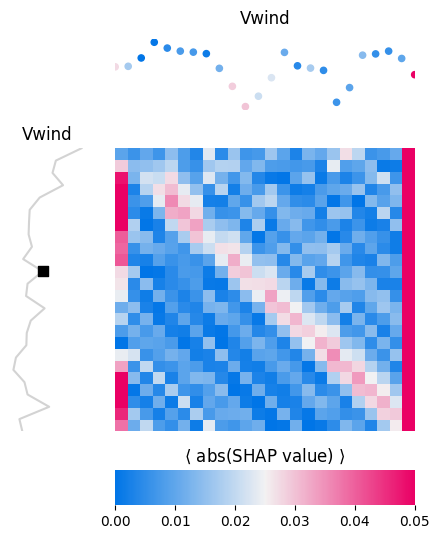

In [228]:
import seaborn as sns
import matplotlib

idx_win_plot = 0
# arbitrary index of a predictor/target window to plot

idx_target_t = 10
# arbitrary index of a timestep along a target window

fig, axes = plt.subplots(figsize=(4.5, 5.5), nrows=3, ncols=2, sharex=False,
                         gridspec_kw={'width_ratios': [1, 4],
                                      'height_ratios': [1, 4, 0.5]})

for c, column_predictor in enumerate(columns_predictors):
        
    # Axes coordinates:
    coord_predictor = (0, c+1)
    # ax indexes of predictor plot
    coord_heatmap = (1, c+1)
    # ax indexes of heatmap corresponding to current predictor
    coord_cbar = (2, c+1)
    # ax indexes of colorbars corresponding to current predictor    
    
    df_shap_abs_mu_predictor = df_shap_abs_mu[[col for col in df_shap_abs_mu.columns if column_predictor in col]]
    # importance dataframe restricted to current predictor
        
    # Heatmap (and related colorbar):
    vmin = 0
    vmax = 0.05 #np.max(df_shap_abs_mu_predictor.values)
    cmap = sns.diverging_palette(255, 0, s=100, sep=1, n=256, as_cmap=True)
    norm = None #matplotlib.colors.LogNorm()
    heatmap = df_shap_abs_mu_predictor.values
        
    sns.heatmap(heatmap, square=False, cbar=True,
                cbar_kws={"shrink": 0.1, "pad": -0.2, "orientation": "horizontal"},
                ax=axes[coord_heatmap], cbar_ax=axes[coord_cbar],
                cmap=cmap, vmin=vmin, vmax=vmax, norm=norm)
    #
    axes[coord_heatmap].set_xticklabels([])
    axes[coord_heatmap].set_yticklabels([])
    axes[coord_heatmap].tick_params(left=False, bottom=False)
    #
    axes[coord_cbar].set_title('$\\langle~$abs(SHAP value)$~\\rangle$')
    axes[coord_cbar].set_yticks([])

    # Predictor window:
    axes[coord_predictor].set_title(column_predictor, y=1.1)
    axes[coord_predictor].scatter(np.arange(len(X_train[idx_win_plot, :, c])),
                                  X_train[idx_win_plot, :, c],
                         s=20, c=df_shap_abs_mu_predictor.iloc[idx_target_t],
                         alpha=1,
                         cmap=cmap, vmin=vmin, vmax=vmax, norm=norm)
    axes[coord_predictor].set_xticks([])
    axes[coord_predictor].set_yticks([])
    axes[coord_predictor].axis('off')

    axes[coord_predictor].set_xlim([0, X_train.shape[1]-1])

# Target window:
axes[1, 0].set_title(column_of_interest)
axes[1, 0].plot(y_train[idx_win_plot, :], np.arange(len(y_train[idx_win_plot, :])),
                'lightgrey', zorder=-1)
axes[1, 0].scatter(y_train[idx_win_plot, idx_target_t], idx_target_t, marker='s',
                   s=50, c='black')
#
axes[1, 0].invert_xaxis()
axes[1, 0].invert_yaxis()
# ^necessary to match indexes between heatmap (0 at top) and array (0 at bottom)
axes[1, 0].axis('off')
axes[1, 0].set_ylim([y_train.shape[1]-1, 0])

# Remove top left panel:
axes[0, 0].set_axis_off()
# Remove bottom left panel:
axes[2, 0].set_axis_off()

plt.subplots_adjust(wspace=0, hspace=0)  
plt.tight_layout()    
plt.savefig(path_results+'/feature_heatmaps.png')

plt.show()

In [ ]:
###EOF

In [ ]:
###EOF

In [ ]:
###EOF